## Notebook for the Khaliq 2022 data preprocessing.
### Developed by: Anna Maguza

### Institute of Computational Biology - Computational Health Centre - Hemlholtz Munich

### 12 October 2022

#### Load required packages

In [12]:
import numpy as np
import pandas as pd
import scanpy as sc
import anndata as an

#### Setup Cells

In [13]:
%matplotlib inline

In [14]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor='white')

scanpy==1.9.1 anndata==0.8.0 umap==0.5.3 numpy==1.21.6 scipy==1.8.1 pandas==1.4.2 scikit-learn==1.1.1 statsmodels==0.13.2 python-igraph==0.9.11 louvain==0.7.1 pynndescent==0.5.7


#### Upload Data

In [35]:
#Data Upload (csv)
UMI_counts = pd.read_csv('/Users/annamaguza/Desktop/Desktop-Anna/LMU/Master-Thesis/Anna-Master-Project/GSE200997_GEO_processed_CRC_10X_raw_UMI_count_matrix.csv', index_col=[0])

In [ ]:
#Checking the file
UMI_counts

#### Creating the anndata file

In [36]:
#To create correct anndata file we need to have barcodes as rows names and genes as columns names, so we are transposing the file
UMI_counts = UMI_counts.T

In [37]:
#Checking the file
UMI_counts

,AL627309.1,AL669831.5,FAM87B,LINC00115,FAM41C,AL645608.3,AL645608.1,SAMD11,NOC2L,KLHL17,...,MAFIP,AC011043.1,AL592183.1,AC007325.4,AC007325.2,AL354822.1,AC004556.1,AC233755.2,AC233755.1,AC240274.1
B_cac10_AAACCTGAGTCAATAG,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
B_cac10_AAACCTGCACAGCCCA,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
B_cac10_AAACCTGCACTTCGAA,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
B_cac10_AAACCTGGTAATTGGA,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
B_cac10_AAACCTGGTACGAAAT,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
T_cac9_TTTGGTTCAACACGCC,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
T_cac9_TTTGGTTCATAGACTC,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
T_cac9_TTTGGTTCATCTATGG,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
T_cac9_TTTGGTTTCAATCTCT,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [38]:
#Data Upload (csv)
meta_data = pd.read_csv('/Users/annamaguza/Desktop/Desktop-Anna/LMU/Master-Thesis/Anna-Master-Project/GSE200997_GEO_processed_CRC_10X_cell_annotation.csv', index_col=[0])

In [39]:
#Checking the file
meta_data

,samples,Condition,Location,MSI_Status,bulk_prediction,prediction
B_cac10_AAACCTGAGTCAATAG,B_cac10,Normal,Left,MSS,NaN,NaN
B_cac10_AAACCTGCACAGCCCA,B_cac10,Normal,Left,MSS,NaN,NaN
B_cac10_AAACCTGCACTTCGAA,B_cac10,Normal,Left,MSS,NaN,NaN
B_cac10_AAACCTGGTAATTGGA,B_cac10,Normal,Left,MSS,NaN,NaN
B_cac10_AAACCTGGTACGAAAT,B_cac10,Normal,Left,MSS,NaN,NaN
...,...,...,...,...,...,...
T_cac9_TTTGGTTCAACACGCC,T_cac9,Tumor,Left,MSS,CMS2,CMS4
T_cac9_TTTGGTTCATAGACTC,T_cac9,Tumor,Left,MSS,CMS2,CMS4
T_cac9_TTTGGTTCATCTATGG,T_cac9,Tumor,Left,MSS,CMS2,CMS1
T_cac9_TTTGGTTTCAATCTCT,T_cac9,Tumor,Left,MSS,CMS2,CMS1


In [41]:
#Create anndata file 
khaliq_2022_anndata = an.AnnData(X=UMI_counts,
                        obs=meta_data,
                        var=UMI_counts.T.iloc[:,:1])

/var/folders/qc/2mwywtjd73z8jw_s09vv_kzm0000gn/T/ipykernel_98193/381456067.py:2: FutureWarning: X.dtype being converted to np.float32 from int64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  khaliq_2022_anndata = an.AnnData(X=UMI_counts,


In [42]:
#Checking anndata file
khaliq_2022_anndata.X

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]], dtype=float32)

In [48]:
#Checking anndata file
khaliq_2022_anndata.var

,B_cac10_AAACCTGAGTCAATAG
AL627309.1,0
AL669831.5,0
FAM87B,0
LINC00115,0
FAM41C,0
...,...
AL354822.1,0
AC004556.1,0
AC233755.2,0
AC233755.1,0


In [49]:
#Checking anndata file
khaliq_2022_anndata.obs

,samples,Condition,Location,MSI_Status,bulk_prediction,prediction
B_cac10_AAACCTGAGTCAATAG,B_cac10,Normal,Left,MSS,NaN,NaN
B_cac10_AAACCTGCACAGCCCA,B_cac10,Normal,Left,MSS,NaN,NaN
B_cac10_AAACCTGCACTTCGAA,B_cac10,Normal,Left,MSS,NaN,NaN
B_cac10_AAACCTGGTAATTGGA,B_cac10,Normal,Left,MSS,NaN,NaN
B_cac10_AAACCTGGTACGAAAT,B_cac10,Normal,Left,MSS,NaN,NaN
...,...,...,...,...,...,...
T_cac9_TTTGGTTCAACACGCC,T_cac9,Tumor,Left,MSS,CMS2,CMS4
T_cac9_TTTGGTTCATAGACTC,T_cac9,Tumor,Left,MSS,CMS2,CMS4
T_cac9_TTTGGTTCATCTATGG,T_cac9,Tumor,Left,MSS,CMS2,CMS1
T_cac9_TTTGGTTTCAATCTCT,T_cac9,Tumor,Left,MSS,CMS2,CMS1


In [45]:
#Save anndata
khaliq_2022_anndata.write('/Users/annamaguza/Desktop/Desktop-Anna/LMU/Master-Thesis/Anna-Master-Project/khaliq_2022_anndata_raw.h5ad', compression='gzip')

#### Data Quality Check and Preprocessing

In [15]:
#Loading again to further processing
input_CRC_file = '/Users/annamaguza/Desktop/Desktop-Anna/LMU/Master-Thesis/Anna-Master-Project/khaliq_2022_anndata_raw.h5ad'  # the file that will store the analysis results
output_CRC_file = '/Users/annamaguza/Desktop/Desktop-Anna/LMU/Master-Thesis/Anna-Master-Project/khaliq_2022_anndata_processed.h5ad'  # the file that will store the analysis results

In [21]:
#Anndata upload
khaliq_ad = sc.read_h5ad(input_CRC_file)
khaliq_ad.X

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]], dtype=float32)

In [17]:
khaliq_ad.obs

,samples,Condition,Location,MSI_Status,bulk_prediction,prediction
B_cac10_AAACCTGAGTCAATAG,B_cac10,Normal,Left,MSS,NaN,NaN
B_cac10_AAACCTGCACAGCCCA,B_cac10,Normal,Left,MSS,NaN,NaN
B_cac10_AAACCTGCACTTCGAA,B_cac10,Normal,Left,MSS,NaN,NaN
B_cac10_AAACCTGGTAATTGGA,B_cac10,Normal,Left,MSS,NaN,NaN
B_cac10_AAACCTGGTACGAAAT,B_cac10,Normal,Left,MSS,NaN,NaN
...,...,...,...,...,...,...
T_cac9_TTTGGTTCAACACGCC,T_cac9,Tumor,Left,MSS,CMS2,CMS4
T_cac9_TTTGGTTCATAGACTC,T_cac9,Tumor,Left,MSS,CMS2,CMS4
T_cac9_TTTGGTTCATCTATGG,T_cac9,Tumor,Left,MSS,CMS2,CMS1
T_cac9_TTTGGTTTCAATCTCT,T_cac9,Tumor,Left,MSS,CMS2,CMS1


normalizing counts per cell
    finished (0:00:05)


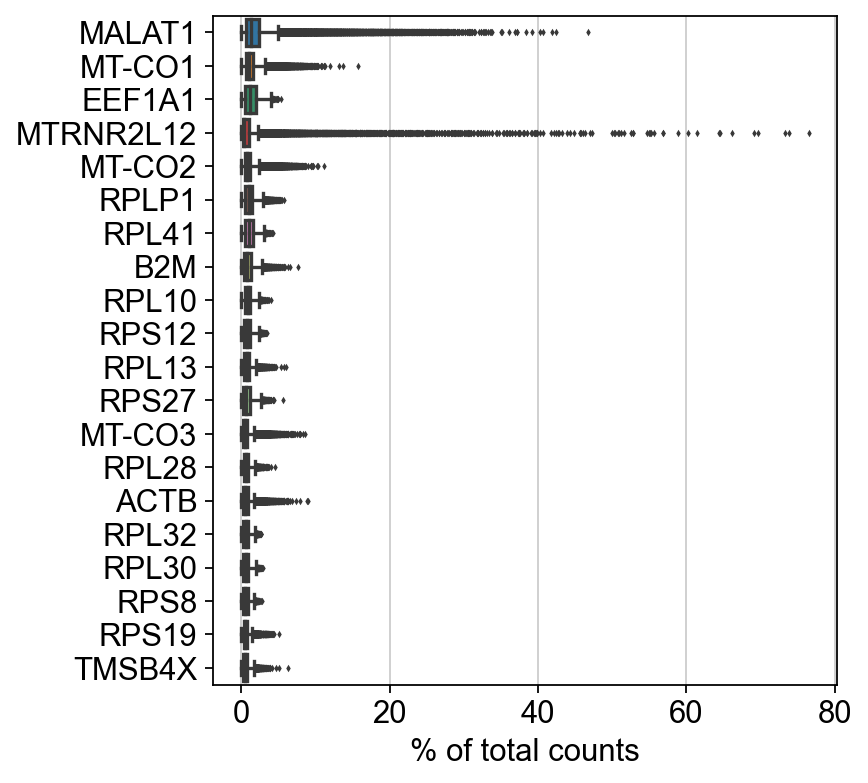

In [5]:
#Show those genes that yield the highest fraction of counts in each single cell, across all cells
sc.pl.highest_expr_genes(khaliq_ad, n_top=20, )

In [23]:
#Calculate quality control metrics
sc.pp.calculate_qc_metrics(khaliq_ad, expr_type = 'counts', var_type='genes', percent_top = None, inplace=True)

In [24]:
#Check the output
khaliq_ad.obs

,samples,Condition,Location,MSI_Status,bulk_prediction,prediction,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts
B_cac10_AAACCTGAGTCAATAG,B_cac10,Normal,Left,MSS,NaN,NaN,297,5.697093,557.0,6.324359
B_cac10_AAACCTGCACAGCCCA,B_cac10,Normal,Left,MSS,NaN,NaN,492,6.200509,1318.0,7.184629
B_cac10_AAACCTGCACTTCGAA,B_cac10,Normal,Left,MSS,NaN,NaN,626,6.440947,1817.0,7.505492
B_cac10_AAACCTGGTAATTGGA,B_cac10,Normal,Left,MSS,NaN,NaN,741,6.609349,2041.0,7.621685
B_cac10_AAACCTGGTACGAAAT,B_cac10,Normal,Left,MSS,NaN,NaN,630,6.447306,2217.0,7.704361
...,...,...,...,...,...,...,...,...,...,...
T_cac9_TTTGGTTCAACACGCC,T_cac9,Tumor,Left,MSS,CMS2,CMS4,1355,7.212294,3463.0,8.150179
T_cac9_TTTGGTTCATAGACTC,T_cac9,Tumor,Left,MSS,CMS2,CMS4,2220,7.705713,7173.0,8.878219
T_cac9_TTTGGTTCATCTATGG,T_cac9,Tumor,Left,MSS,CMS2,CMS1,1303,7.173192,3283.0,8.096817
T_cac9_TTTGGTTTCAATCTCT,T_cac9,Tumor,Left,MSS,CMS2,CMS1,595,6.390241,995.0,6.903747


In [25]:
#Adding percentage of mitochondrial genes
khaliq_ad.var['mt'] = khaliq_ad.var_names.str.startswith('MT-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(khaliq_ad, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

In [26]:
#Adding percentage of ribosomial genes
khaliq_ad.var['ribo'] = khaliq_ad.var_names.str.startswith(("RPS","RPL"))  # annotate the group of ribosomal genes as 'ribo'
sc.pp.calculate_qc_metrics(khaliq_ad, qc_vars=['ribo'], percent_top=None, log1p=False, inplace=True)

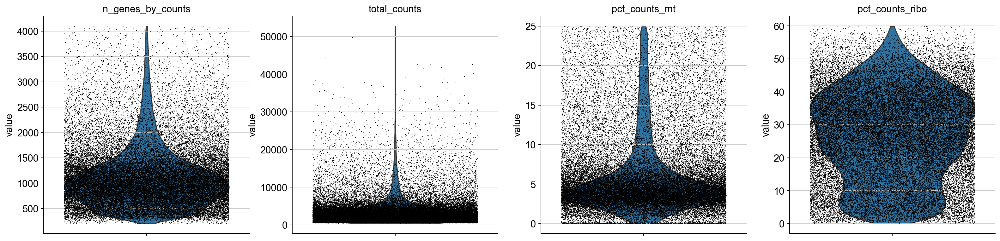

In [27]:
#A violin plot of some of the computed quality measures:
    # the number of genes expressed in the count matrix
    #the total counts per cell
    #the percentage of counts in mitochondrial genes
    #the percentage of counts in ribosomial genes
sc.pl.violin(khaliq_ad, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt', 'pct_counts_ribo'],
             jitter=0.4, multi_panel=True)

In [28]:
#Delete normal samples (leave only tumor)
khaliq_ad_tumor = khaliq_ad[khaliq_ad.obs.Condition == "Tumor", :]

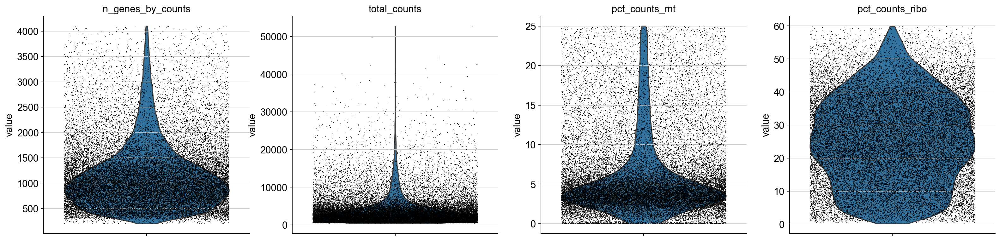

In [29]:
#A violin plot of some of the computed quality measures:
    # the number of genes expressed in the count matrix
    #the total counts per cell
    #the percentage of counts in mitochondrial genes
    #the percentage of counts in ribosomial genes
sc.pl.violin(khaliq_ad_tumor, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt', 'pct_counts_ribo'],
             jitter=0.4, multi_panel=True)

/Users/annamaguza/miniforge3/envs/cell_analysis/lib/python3.10/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


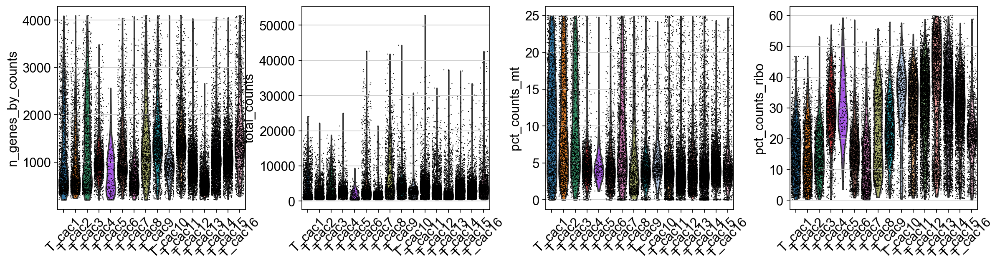

In [31]:
#Check Quality Metrics by Samples
#Create visualisation of QC covariates for samples
sc.pl.violin(khaliq_ad_tumor, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt','pct_counts_ribo'],
             jitter=0.4, groupby = 'samples', rotation = 45)

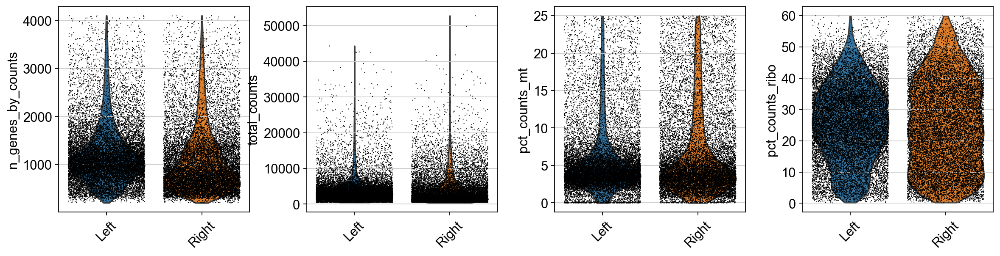

In [32]:
#Check Quality Metrics by Samples
#Create visualisation of QC covariates for Tumor location
sc.pl.violin(khaliq_ad_tumor, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt','pct_counts_ribo'],
             jitter=0.4, groupby = 'Location', rotation = 45)

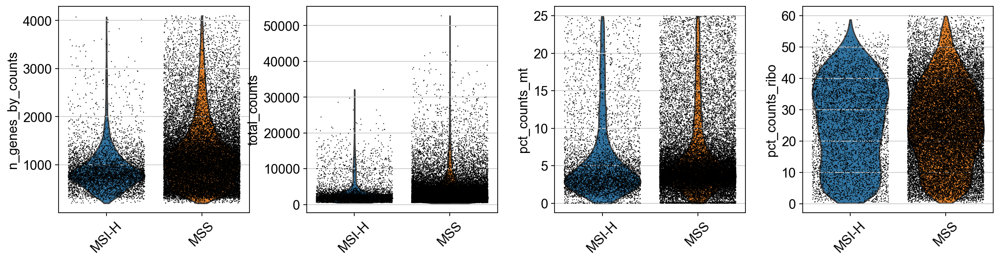

In [33]:
#Check Quality Metrics by Samples
#Create visualisation of QC covariates for MSI status
sc.pl.violin(khaliq_ad_tumor, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt','pct_counts_ribo'],
             jitter=0.4, groupby = 'MSI_Status', rotation = 45)

In [40]:
khaliq_ad_tumor.obs

,samples,Condition,Location,MSI_Status,bulk_prediction,prediction,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,total_counts_mt,pct_counts_mt,total_counts_ribo,pct_counts_ribo
T_cac1_AAACCTGAGAATAGGG,T_cac1,Tumor,Right,MSS,CMS4,CMS2,504,6.224558,922.0,6.827629,142.0,15.401300,133.0,14.425163
T_cac1_AAACCTGAGCAGCGTA,T_cac1,Tumor,Right,MSS,CMS4,CMS4,3177,8.064007,11519.0,9.351840,526.0,4.566369,1656.0,14.376248
T_cac1_AAACCTGCAATCTGCA,T_cac1,Tumor,Right,MSS,CMS4,CMS3,465,6.144186,831.0,6.723833,166.0,19.975931,50.0,6.016847
T_cac1_AAACCTGGTCTTGCGG,T_cac1,Tumor,Right,MSS,CMS4,CMS3,329,5.799093,527.0,6.269096,32.0,6.072106,99.0,18.785578
T_cac1_AAACCTGGTGTGCCTG,T_cac1,Tumor,Right,MSS,CMS4,CMS3,2887,7.968320,8388.0,9.034677,820.0,9.775870,1501.0,17.894611
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
T_cac9_TTTGGTTCAACACGCC,T_cac9,Tumor,Left,MSS,CMS2,CMS4,1355,7.212294,3463.0,8.150179,147.0,4.244874,853.0,24.631823
T_cac9_TTTGGTTCATAGACTC,T_cac9,Tumor,Left,MSS,CMS2,CMS4,2220,7.705713,7173.0,8.878219,286.0,3.987174,1994.0,27.798689
T_cac9_TTTGGTTCATCTATGG,T_cac9,Tumor,Left,MSS,CMS2,CMS1,1303,7.173192,3283.0,8.096817,263.0,8.010965,771.0,23.484617
T_cac9_TTTGGTTTCAATCTCT,T_cac9,Tumor,Left,MSS,CMS2,CMS1,595,6.390241,995.0,6.903747,107.0,10.753769,33.0,3.316583


In [36]:
#Mean percentage of ribosomial counts
from statistics import mean
mean(khaliq_ad_tumor.obs.pct_counts_ribo)

25.512582434927833

In [38]:
#Mean percentage of mitochondrial counts
mean(khaliq_ad_tumor.obs.pct_counts_mt)

6.016092421808157

In [41]:
#Total Counts
sum(khaliq_ad_tumor.obs.total_counts)

124985937.0

In [43]:
#Mean Genes per Cell
sum(khaliq_ad_tumor.obs.n_genes_by_counts)/31586

1154.7963021591845

In [44]:
#Mean Reads per Cell
sum(khaliq_ad_tumor.obs.total_counts)/31586

3957.0042740454633